# Imports

In [171]:
import numpy as np
import random
import pylab
from scipy import stats
import pylab as pl
import mpl_toolkits


import pandas as pd
from sklearn.datasets import make_blobs
import plotly.express as px
import seaborn as sns
from sklearn.tree import export_graphviz
from matplotlib import pyplot as plt
# import plotly as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OneHotEncoder

from pandas_profiling import ProfileReport


from sklearn.cluster import DBSCAN
import numpy as np
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, AffinityPropagation
from sklearn.metrics import adjusted_rand_score, silhouette_score

# Loading, transforming, visualisation data

In [172]:
df = pd.read_excel('/Users/user/Desktop/netology/ml/geo.xlsx')
df.head()

,Unnamed: 0,x,y,comment_class
0,0,37.612416,55.777454,-1
1,1,37.612416,55.777454,-1
2,2,37.603298,55.742108,-1
3,3,37.558526,55.728758,-1
4,4,37.566431,55.731794,-1


In [173]:
profile = ProfileReport(df)
profile

/Users/user/anaconda3/lib/python3.7/site-packages/pandas_profiling/describe.py:392: FutureWarning:

The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.



Number of variables,4
Number of observations,108806
Total Missing (%),0.0%
Total size in memory,3.3 MiB
Average record size in memory,32.0 B
Numeric,3
Categorical,0
Boolean,1
Date,0
Text (Unique),0
Rejected,0


In [174]:
df.drop('Unnamed: 0', axis = 1, inplace = True)
df

,x,y,comment_class
0,37.612416,55.777454,-1
1,37.612416,55.777454,-1
2,37.603298,55.742108,-1
3,37.558526,55.728758,-1
4,37.566431,55.731794,-1
...,...,...,...
108801,37.454528,55.792331,-1
108802,37.384325,55.899068,-1
108803,37.421066,55.848756,1
108804,37.448509,55.793065,-1


<AxesSubplot:xlabel='x', ylabel='y'>

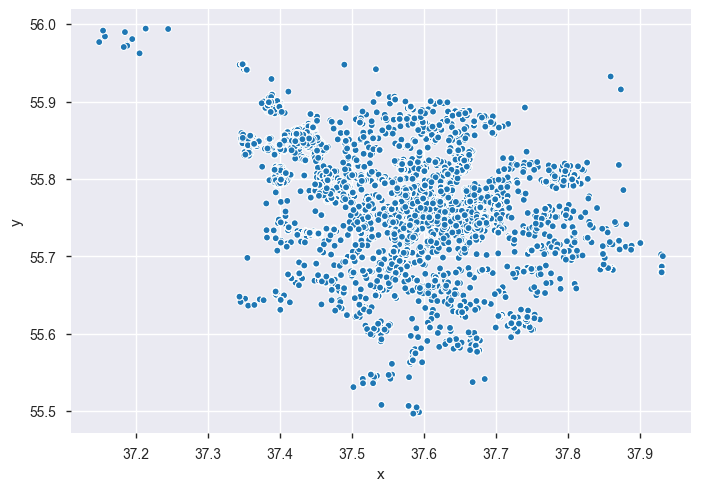

In [175]:
# all voices
sns.scatterplot(x='x', y='y', legend = False,
                data=df, size=1, palette="Set2")

<AxesSubplot:xlabel='x', ylabel='y'>

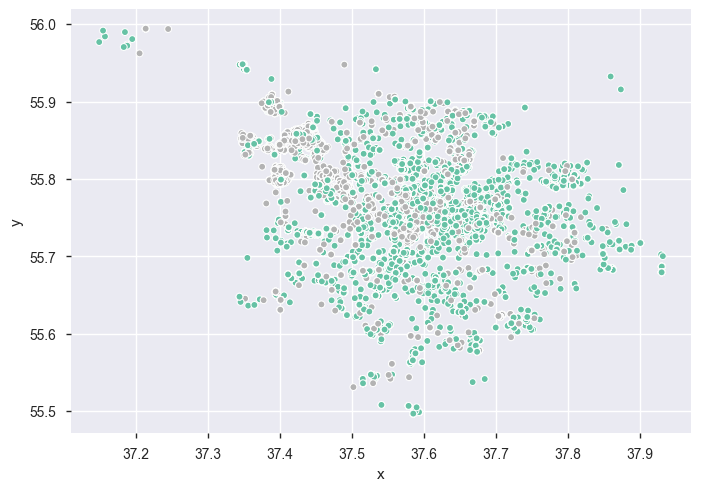

In [176]:
# all voices with pos|neg dividing
sns.scatterplot(x='x', y='y', legend = False, hue="comment_class",
                data=df, size=1, palette="Set2")

# Modeling on all data

## DBSCAN

In [177]:
from itertools import product

In [178]:
def print_clasters(df, labels):
    tmp_df = df
    tmp_df['res'] = labels
    sns.scatterplot(x='x', y='y', data=tmp_df, hue="res", 
                    palette="Set2", label = 'full')
    plt.show()

esp =  0.02
min_samplas =  1000
silhouette score =  0.24973769105728394


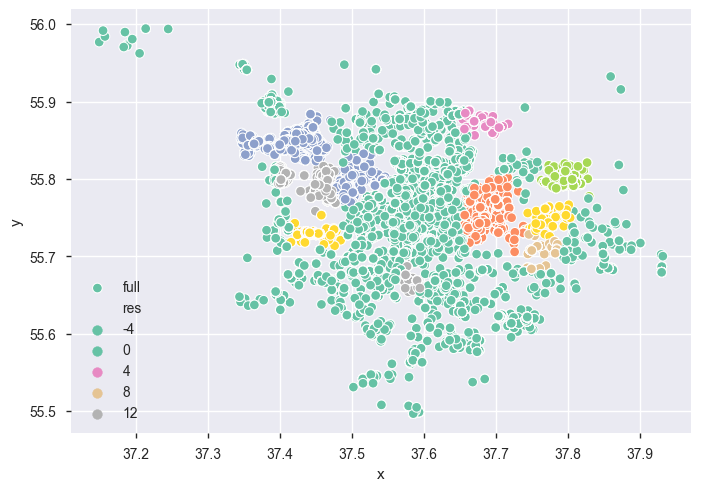

esp =  0.02
min_samplas =  2000
silhouette score =  0.4318381739604646


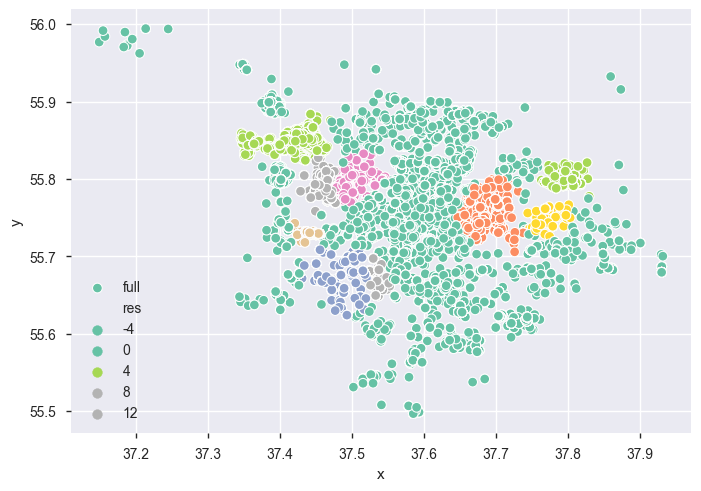

esp =  0.02
min_samplas =  3000
silhouette score =  0.4005639432920455


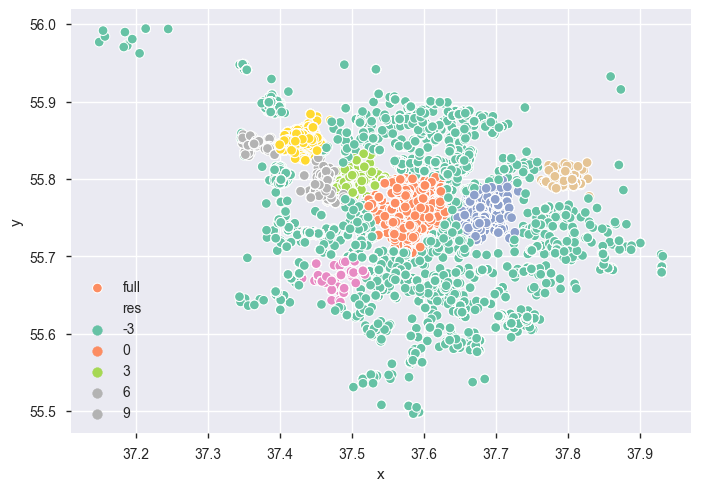

esp =  0.02
min_samplas =  4000
silhouette score =  0.33261188250056845


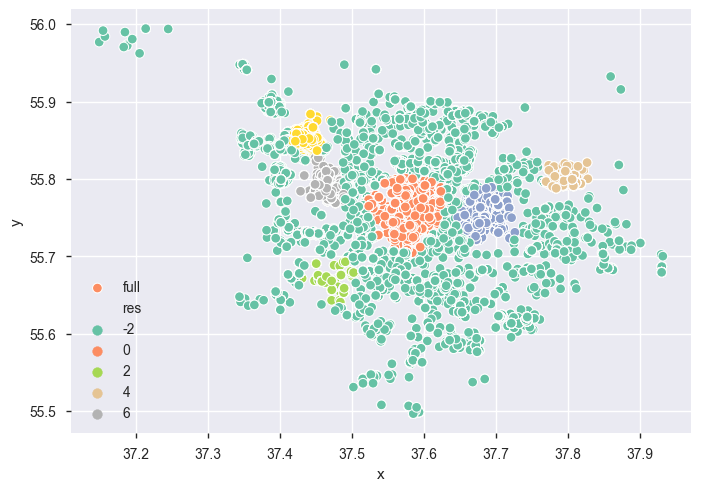

esp =  0.02
min_samplas =  5000
silhouette score =  0.3178555243675612


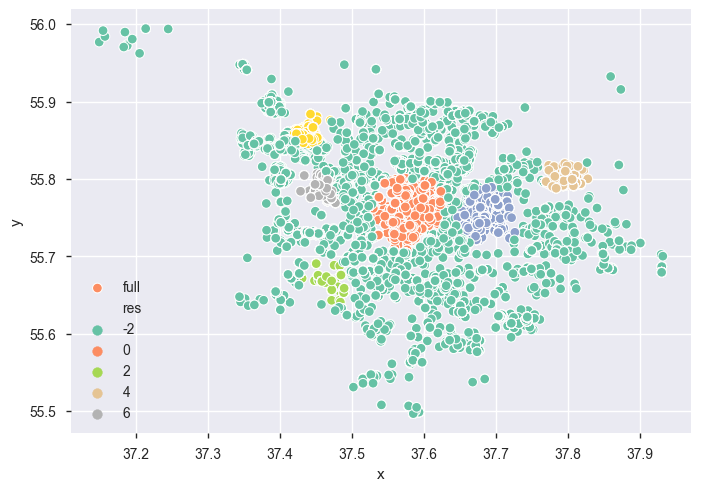

esp =  0.03
min_samplas =  1000
silhouette score =  -0.1608926521359174


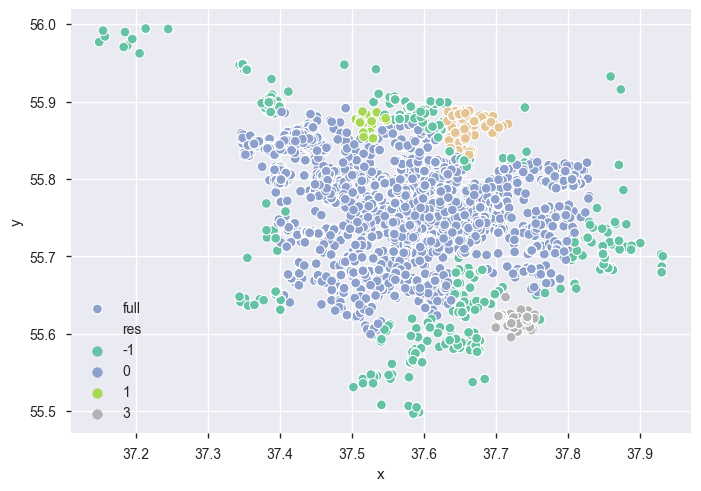

esp =  0.03
min_samplas =  2000
silhouette score =  0.18513833374627


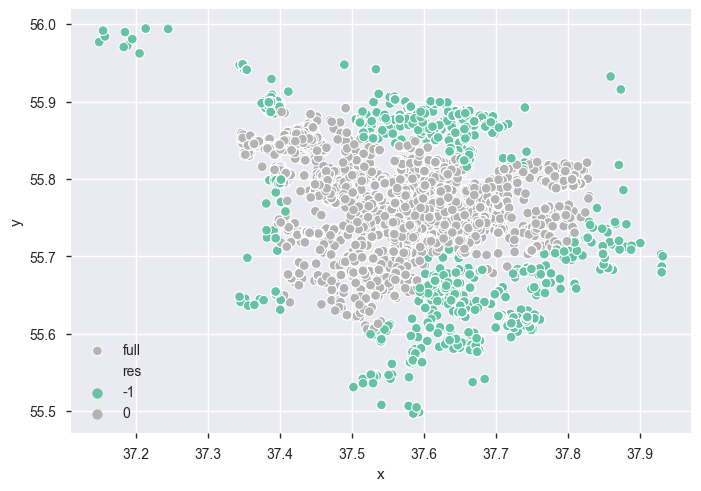

esp =  0.03
min_samplas =  3000
silhouette score =  0.1756848907959277


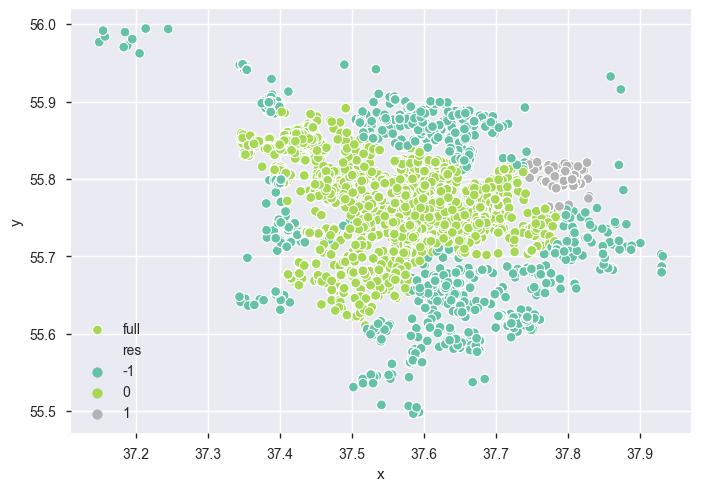

esp =  0.03
min_samplas =  4000
silhouette score =  0.4698732474297675


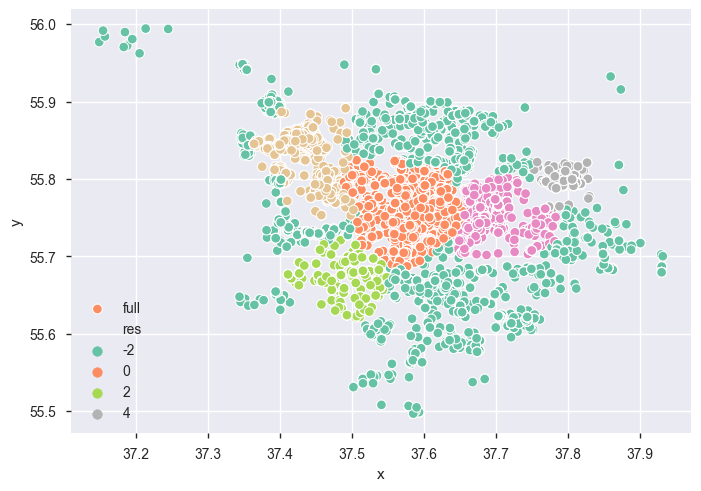

esp =  0.03
min_samplas =  5000
silhouette score =  0.41228401353818417


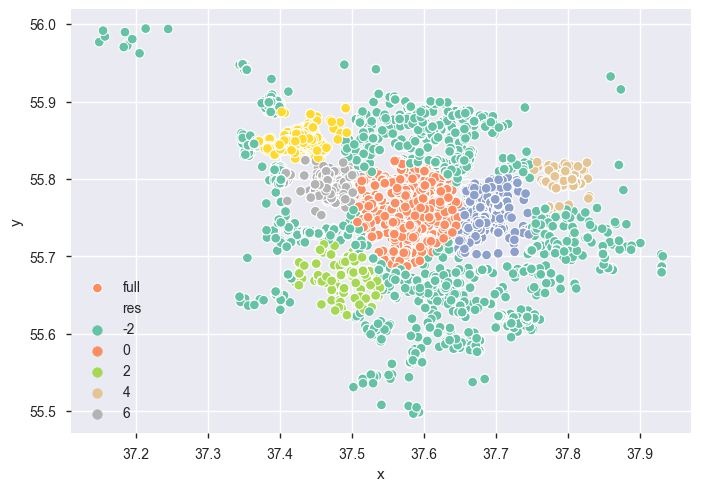

esp =  0.039999999999999994
min_samplas =  1000
silhouette score =  0.39296935435938063


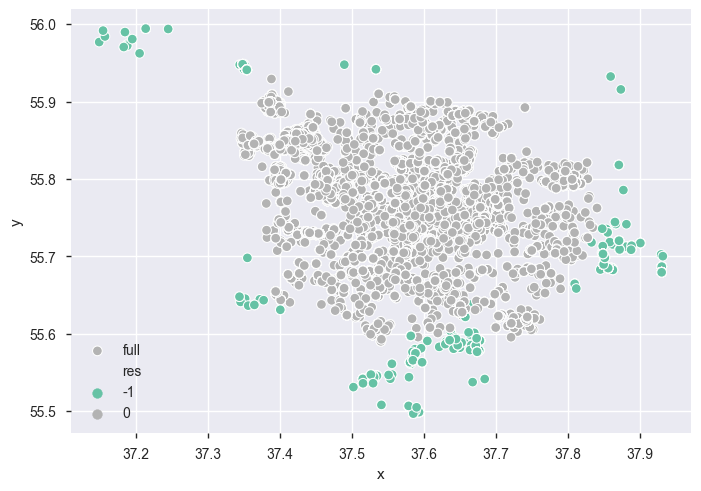

esp =  0.039999999999999994
min_samplas =  2000
silhouette score =  0.10607770619049064


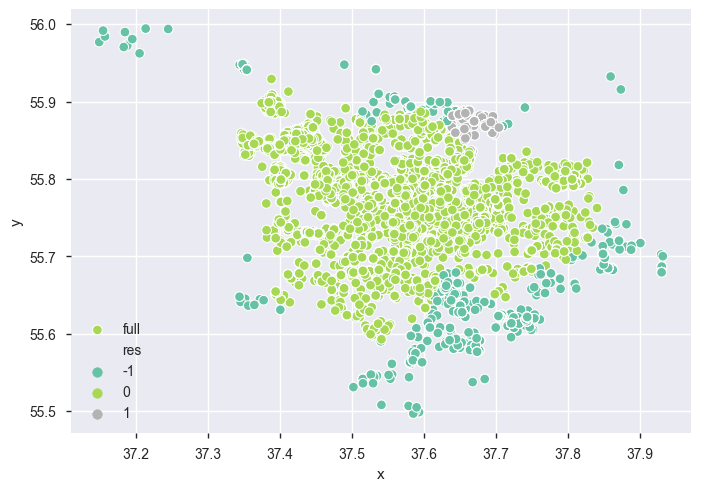

esp =  0.039999999999999994
min_samplas =  3000
silhouette score =  0.21624866434448786


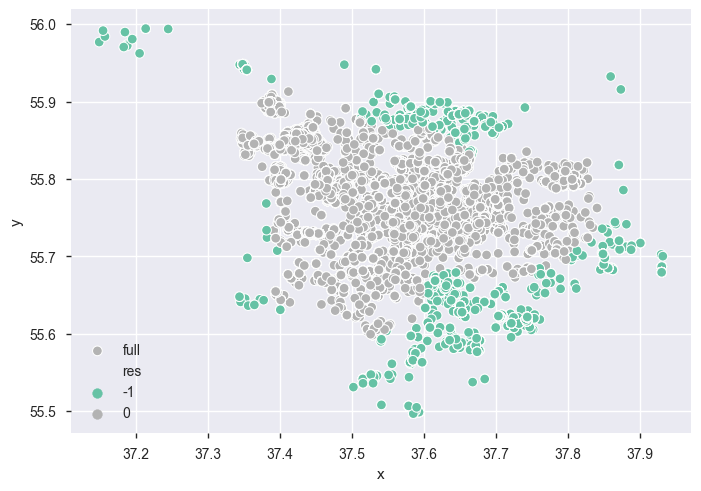

esp =  0.039999999999999994
min_samplas =  4000
silhouette score =  0.20559677432889242


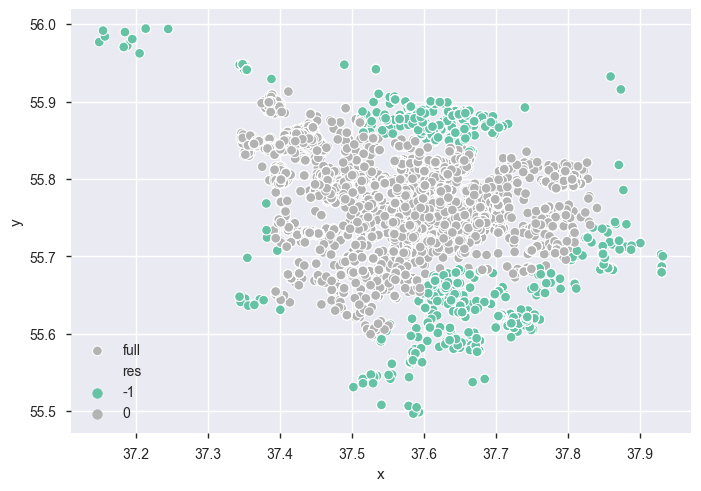

esp =  0.039999999999999994
min_samplas =  5000
silhouette score =  0.18338388576912515


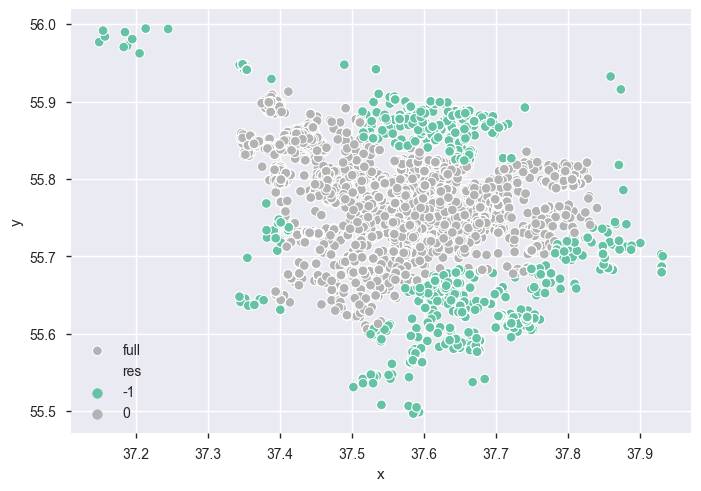

esp =  0.049999999999999996
min_samplas =  1000
silhouette score =  0.41180677308564473


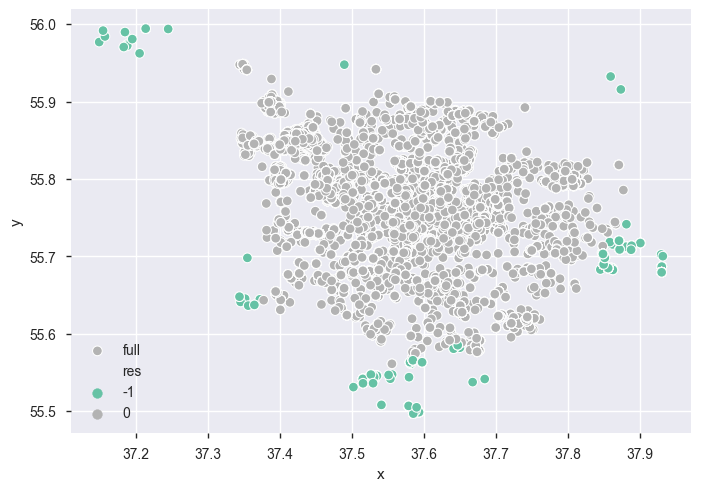

esp =  0.049999999999999996
min_samplas =  2000
silhouette score =  0.3177666187968005


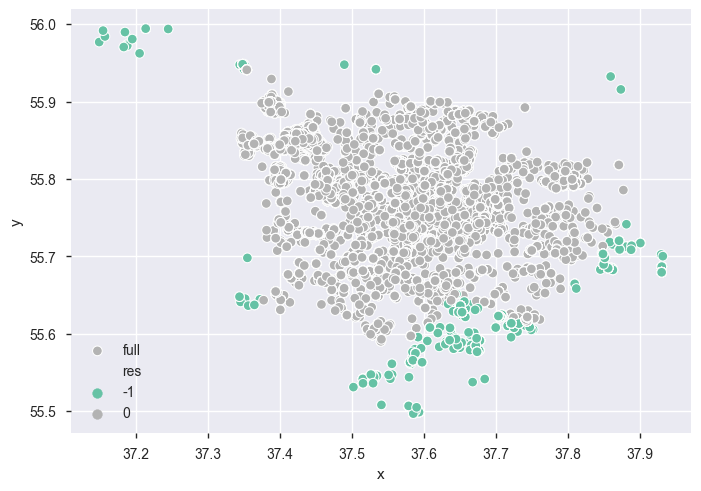

esp =  0.049999999999999996
min_samplas =  3000
silhouette score =  0.23697358971906207


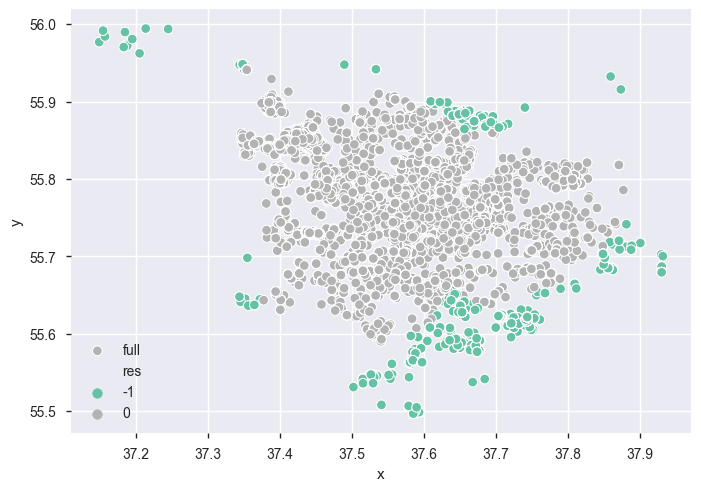

esp =  0.049999999999999996
min_samplas =  4000
silhouette score =  0.2410619920996609


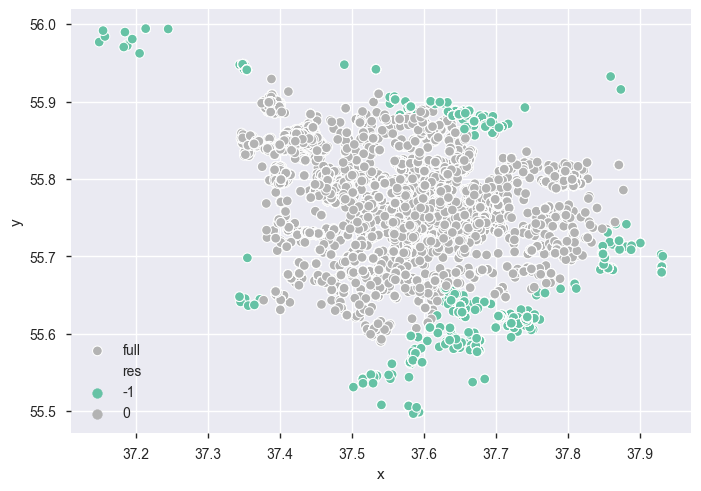

esp =  0.049999999999999996
min_samplas =  5000
silhouette score =  0.22800021741534296


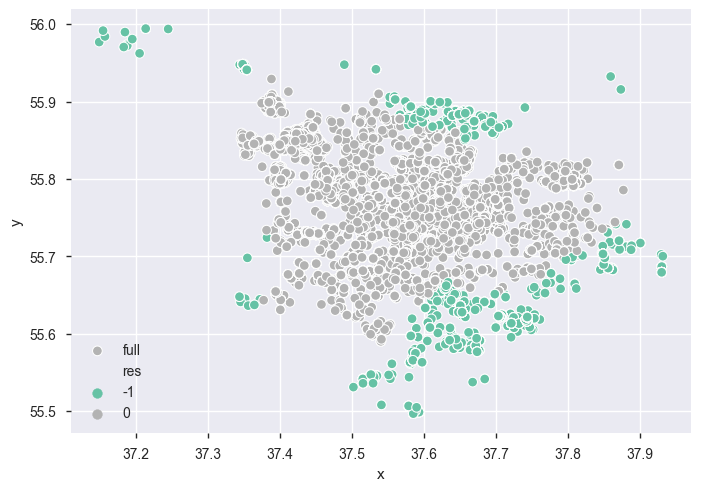

In [182]:
e = np.arange(0.02, 0.06, 0.01)
n = range(1000,6000,1000)

for i,j in product(e,n):
    clustering = DBSCAN(eps=i, min_samples=j).fit(df[['x','y']])
    print('esp = ', i)
    print('min_samplas = ', j)
    print('silhouette score = ',silhouette_score(df[['x','y']], clustering.labels_))
    print_clasters(df, clustering.labels_)

# Modeling on positiv voits

<AxesSubplot:xlabel='x', ylabel='y'>

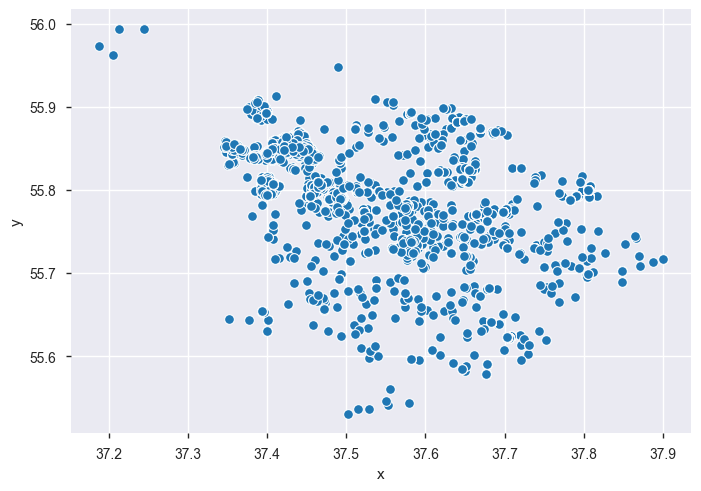

In [183]:
sns.scatterplot(x='x', y='y', data=df[df['comment_class'] == 1], palette="Set2")

esp =  0.02
min_samplas =  500
silhouette score =  0.5002067470478233


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



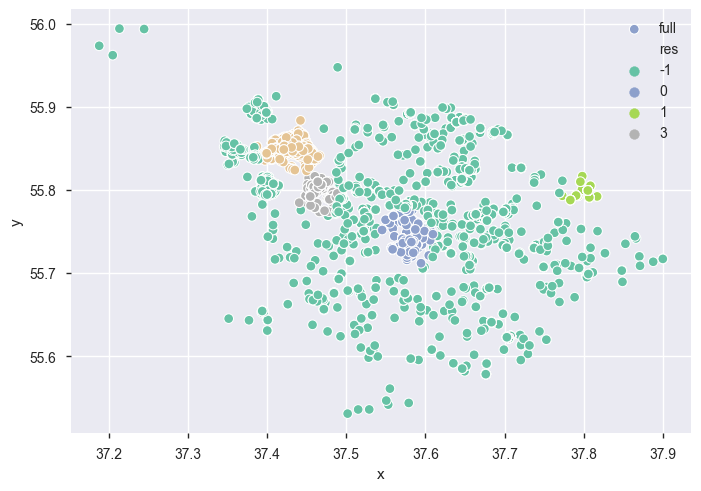

esp =  0.02
min_samplas =  1000
silhouette score =  0.4507988323799952


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



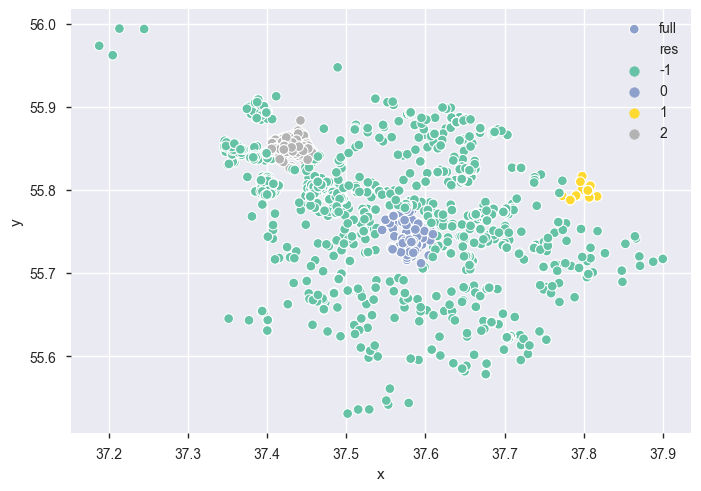

esp =  0.02
min_samplas =  1500
silhouette score =  0.4249639668540954


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



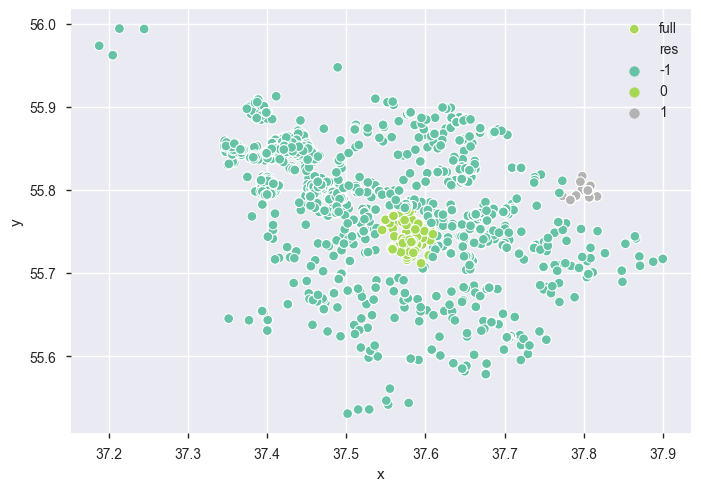

esp =  0.02
min_samplas =  2000
silhouette score =  0.4249639668540954


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



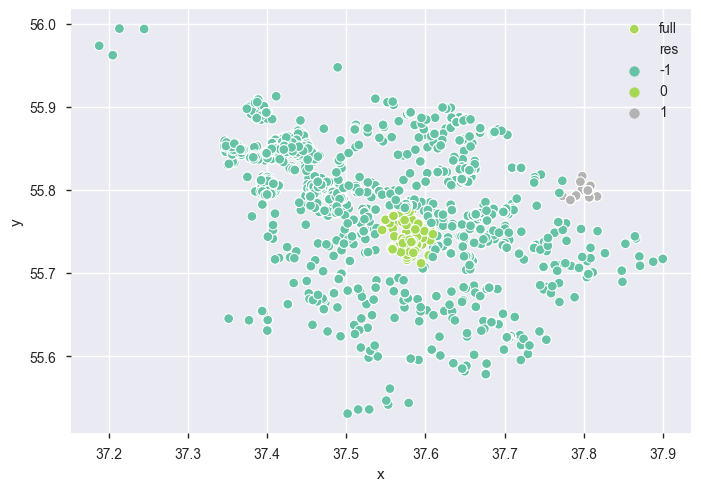

esp =  0.03
min_samplas =  500
silhouette score =  0.609867235816871


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



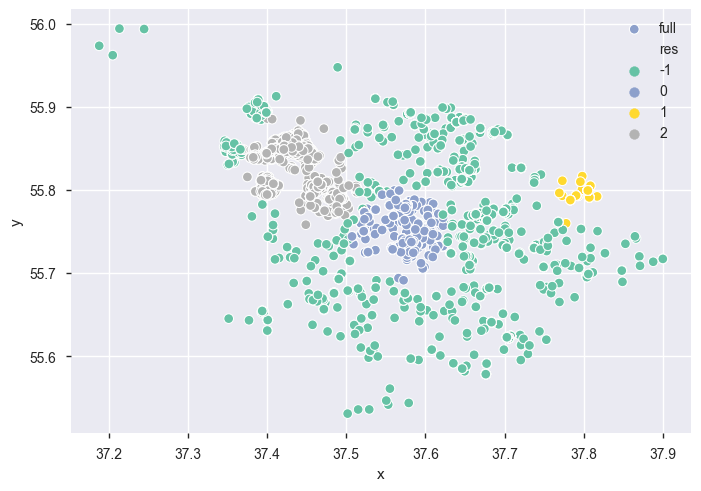

esp =  0.03
min_samplas =  1000
silhouette score =  0.50381355651849


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



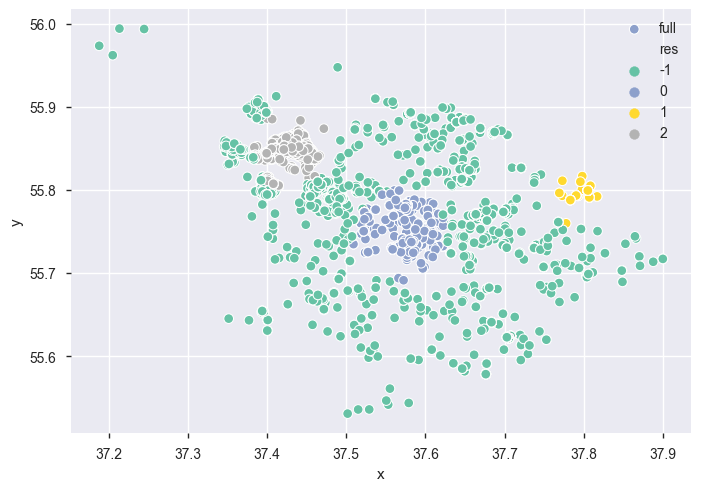

esp =  0.03
min_samplas =  1500
silhouette score =  0.48017867063288455


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



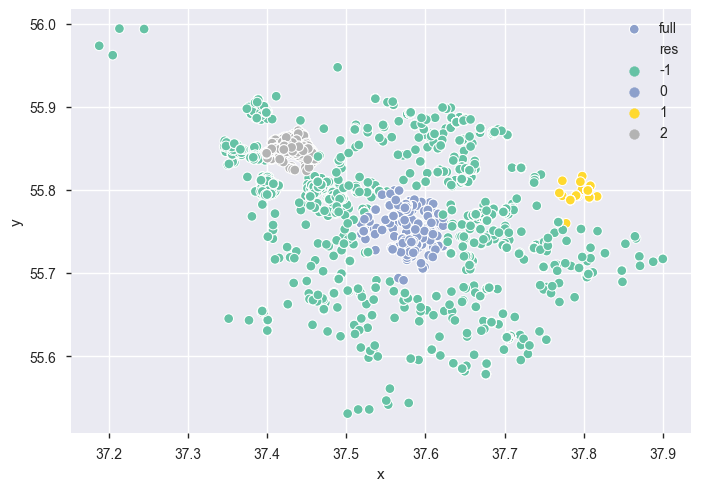

esp =  0.03
min_samplas =  2000
silhouette score =  0.4432890276384508


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



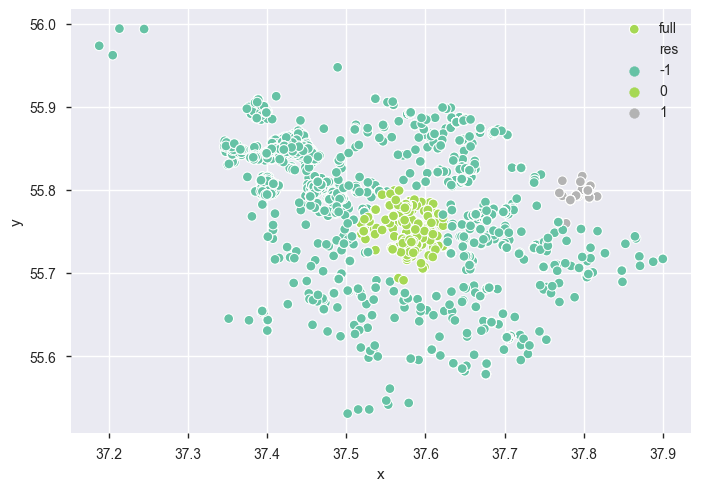

esp =  0.039999999999999994
min_samplas =  500
silhouette score =  0.7041663932614901


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



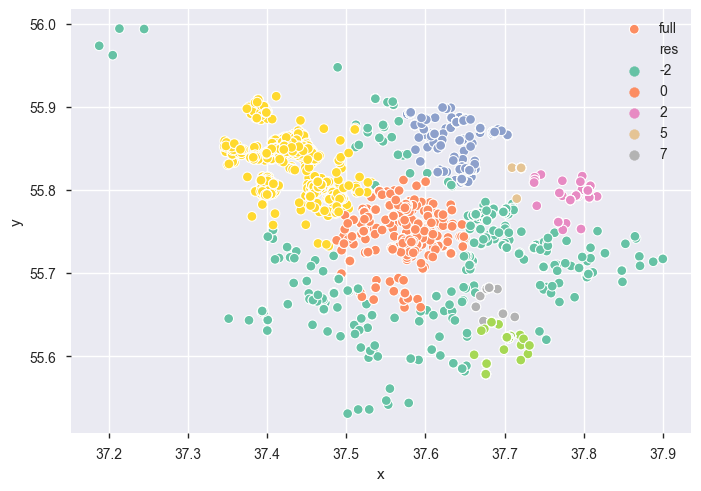

esp =  0.039999999999999994
min_samplas =  1000
silhouette score =  0.6117953982765282


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



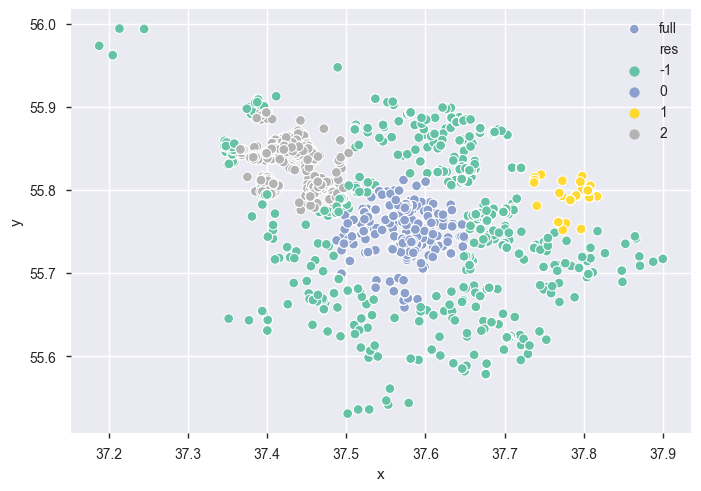

esp =  0.039999999999999994
min_samplas =  1500
silhouette score =  0.5857228365440494


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



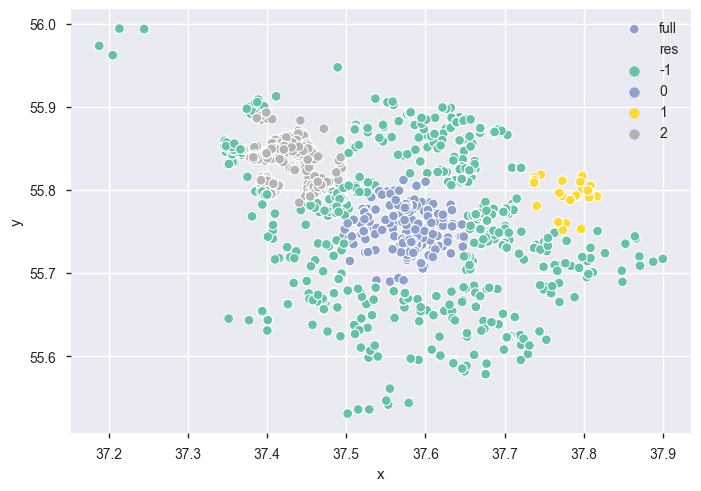

esp =  0.039999999999999994
min_samplas =  2000
silhouette score =  0.5486084597536193


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



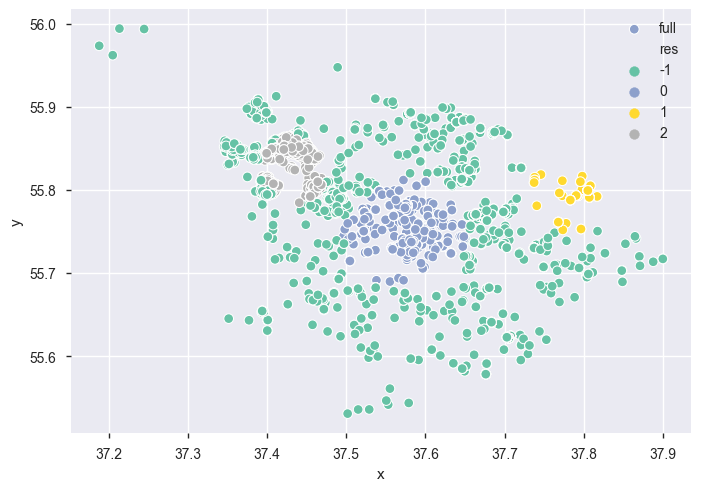

esp =  0.049999999999999996
min_samplas =  500
silhouette score =  0.5327599116159644


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



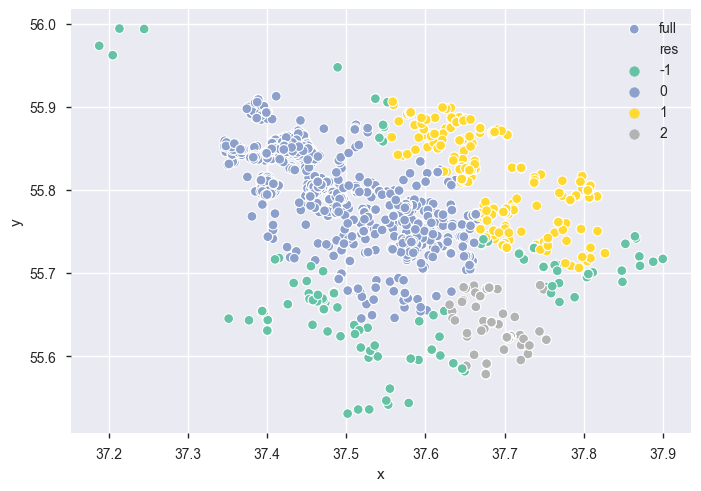

esp =  0.049999999999999996
min_samplas =  1000
silhouette score =  0.5373945501888395


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



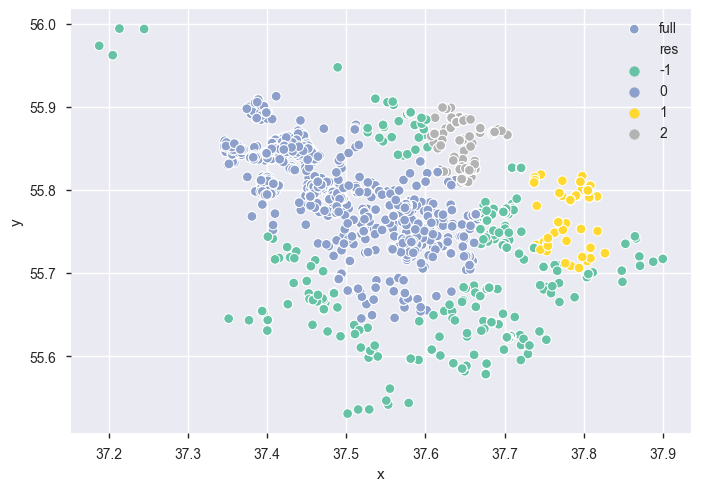

esp =  0.049999999999999996
min_samplas =  1500
silhouette score =  0.6419315569120821


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



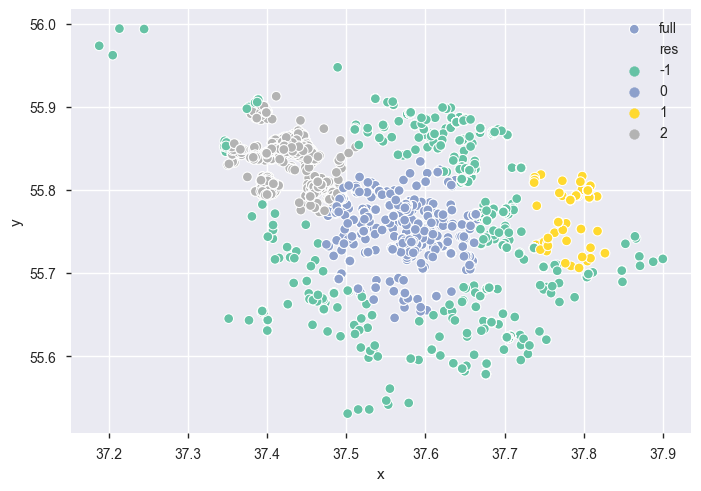

esp =  0.049999999999999996
min_samplas =  2000
silhouette score =  0.6206030979315174


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



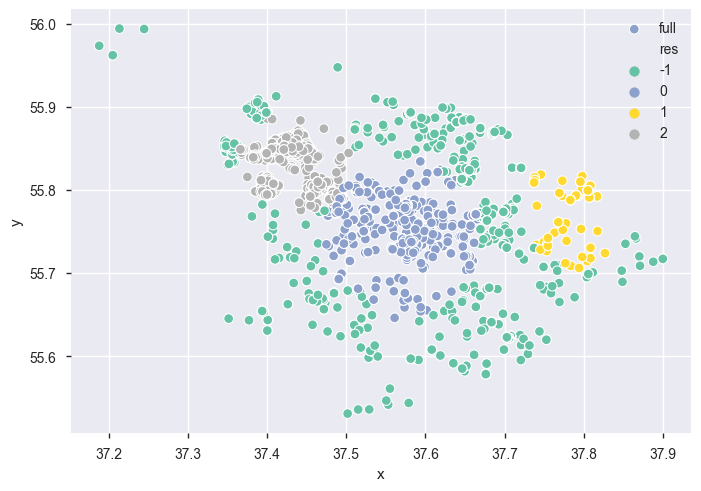

In [184]:
e = np.arange(0.02, 0.06, 0.01)
n = range(500,2500,500)

for i,j in product(e,n):
    clustering = DBSCAN(eps=i, min_samples=j).fit(df[df['comment_class'] == 1][['x','y']])
    print('esp = ', i)
    print('min_samplas = ', j)
    print('silhouette score = ',silhouette_score(df[df['comment_class'] == 1][['x','y']], clustering.labels_))
    print_clasters(df[df['comment_class'] == 1], clustering.labels_)

# Modeling on negative voits


<AxesSubplot:xlabel='x', ylabel='y'>

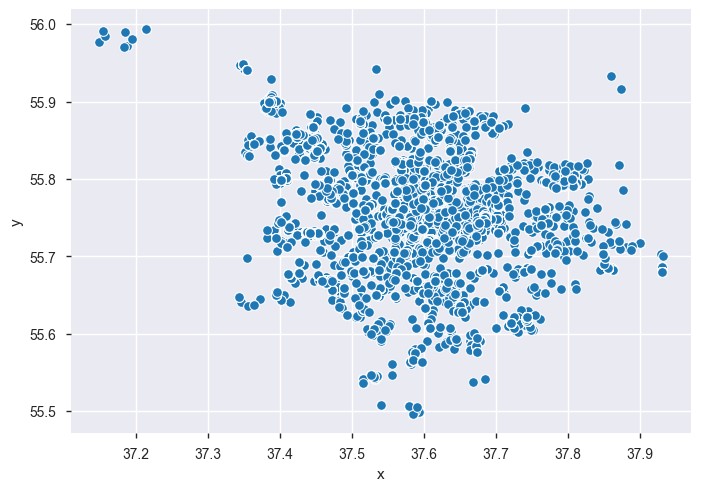

In [185]:
sns.scatterplot(x='x', y='y', data=df[df['comment_class'] == -1], palette="Set2")

esp =  0.02
min_samplas =  2000
silhouette score =  0.4621697990157406


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



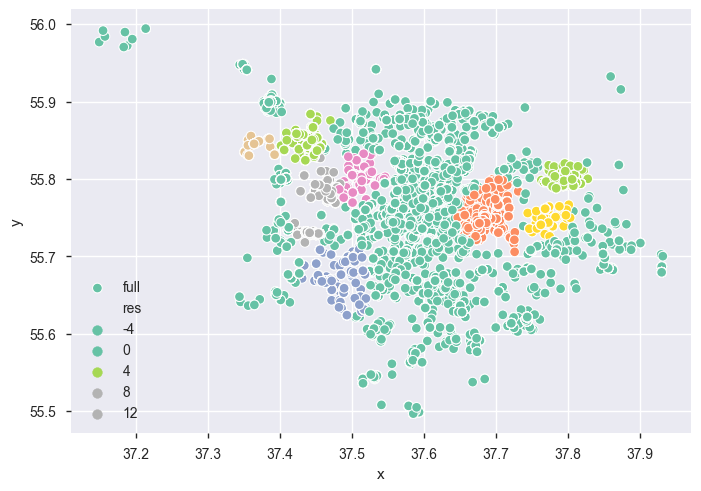

esp =  0.02
min_samplas =  3000
silhouette score =  0.3717896295395928


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



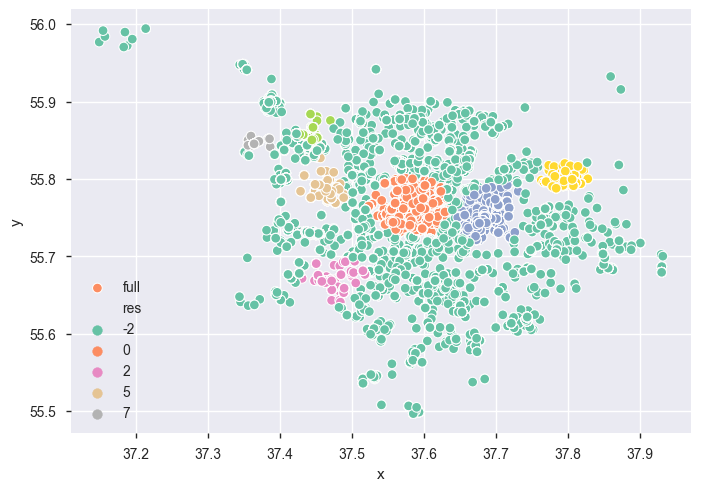

esp =  0.02
min_samplas =  4000
silhouette score =  0.24646379570846952


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



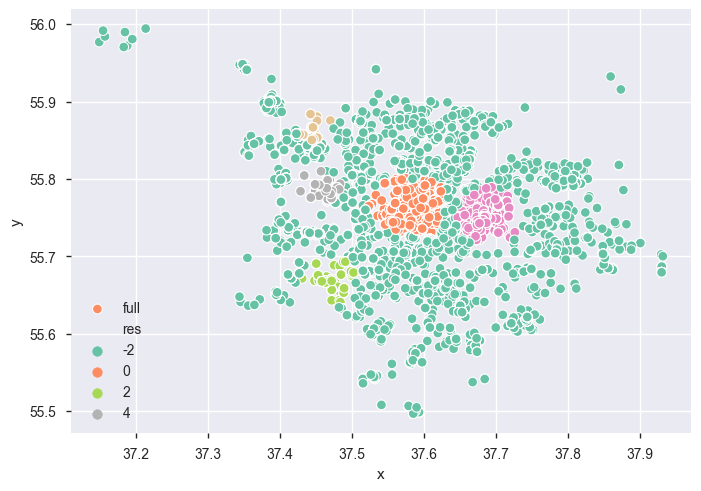

esp =  0.02
min_samplas =  5000
silhouette score =  0.23001710618379032


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



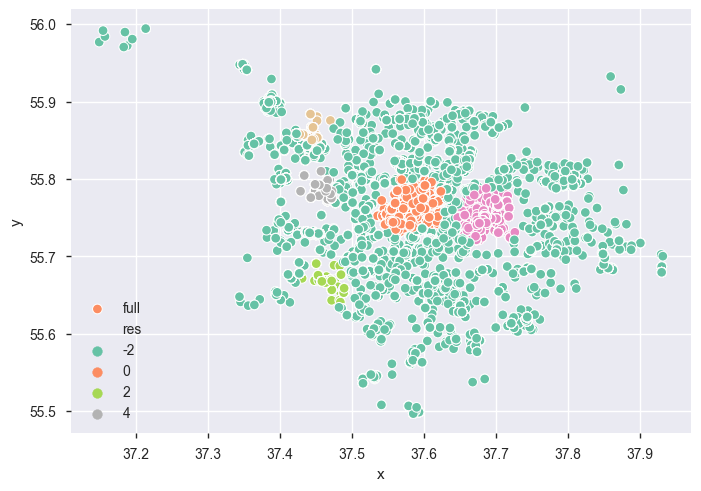

esp =  0.03
min_samplas =  2000
silhouette score =  0.20453366918121546


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



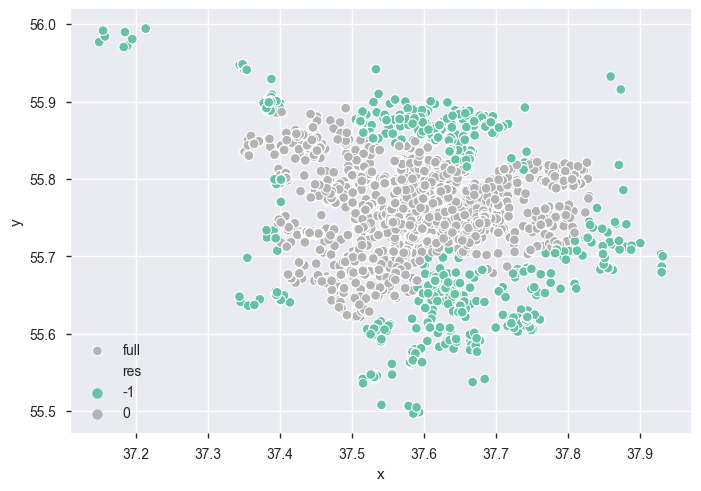

esp =  0.03
min_samplas =  3000
silhouette score =  0.1113457574454387


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



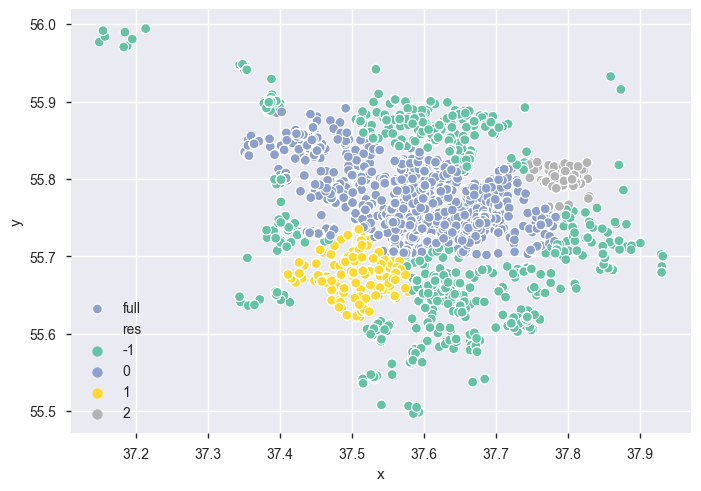

esp =  0.03
min_samplas =  4000
silhouette score =  0.37984582877469614


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



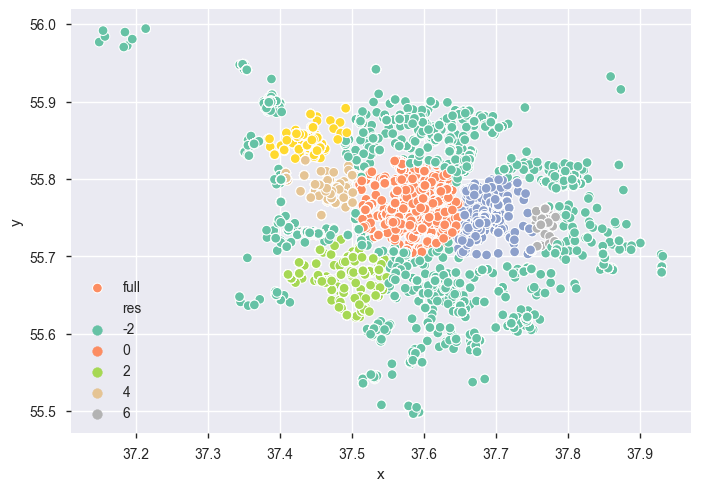

esp =  0.03
min_samplas =  5000
silhouette score =  0.3411926017639965


/Users/user/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



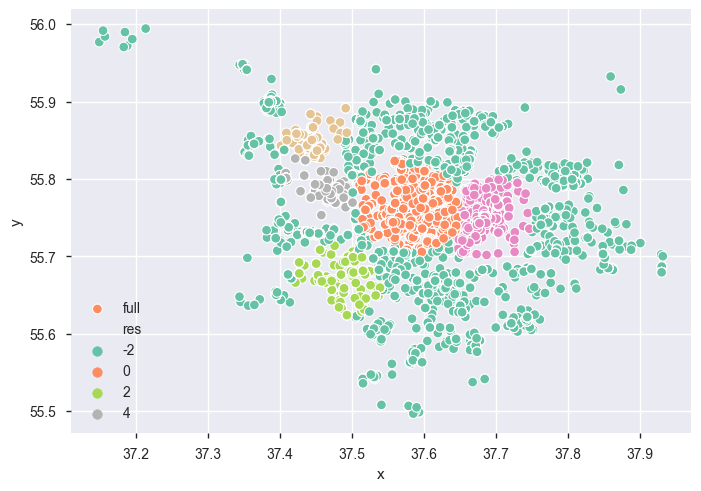

In [187]:
e = np.arange(0.02, 0.04, 0.01)
n = range(2000,6000,1000)

for i,j in product(e,n):
    clustering = DBSCAN(eps=i, min_samples=j).fit(df[df['comment_class'] == -1][['x','y']])
    print('esp = ', i)
    print('min_samplas = ', j)
    print('silhouette score = ',silhouette_score(df[df['comment_class'] == -1][['x','y']], clustering.labels_))
    print_clasters(df[df['comment_class'] == -1], clustering.labels_)

Визуальные итоги и silhouette_score соответствуют.

На выборке меньшего объема DBSCAN работает лучше

Результаты по расположению и кол-ву районов значительно не отличаются при рассмотрении голосов за или против, хотя заметны некоторые перевесы голосов за и против в конкретных районах

## KMeans

n clusters =  1


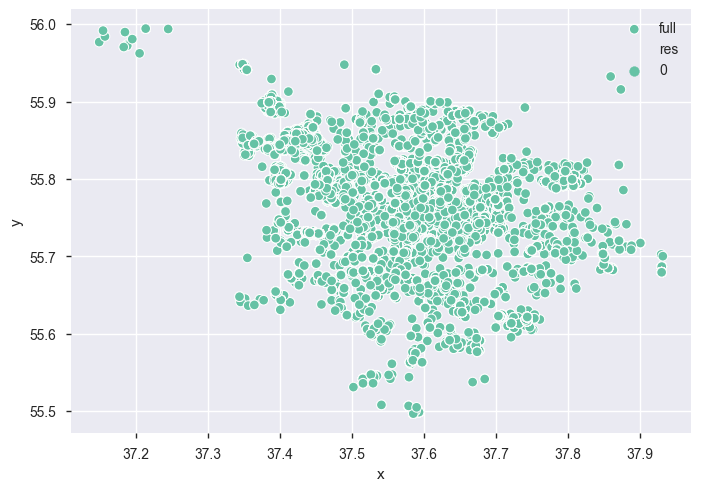

n clusters =  2


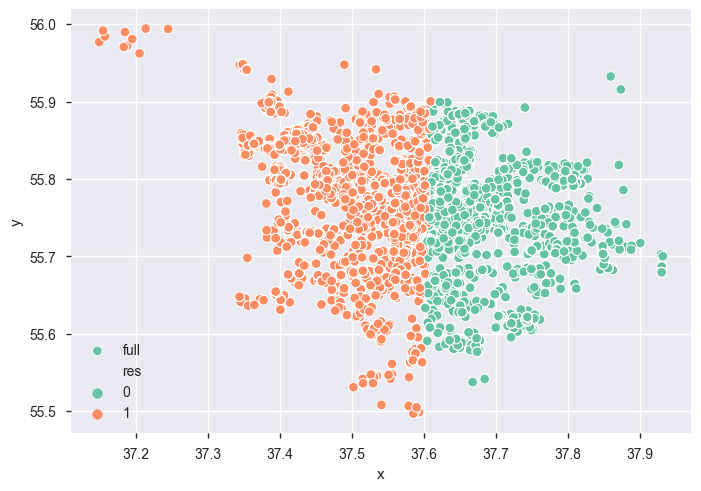

n clusters =  3


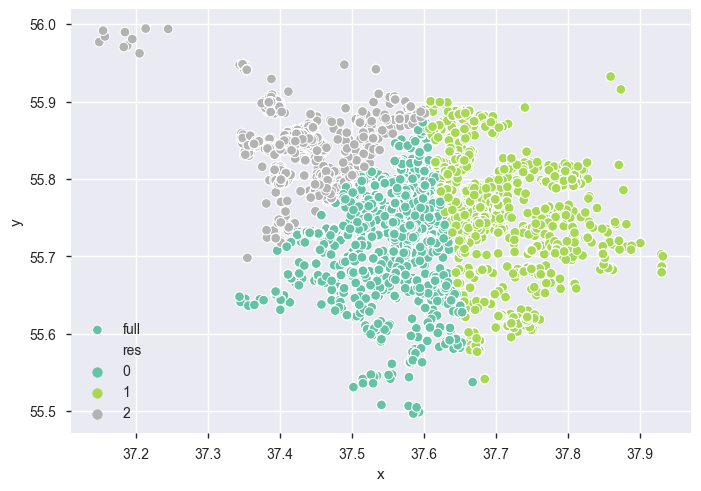

n clusters =  4


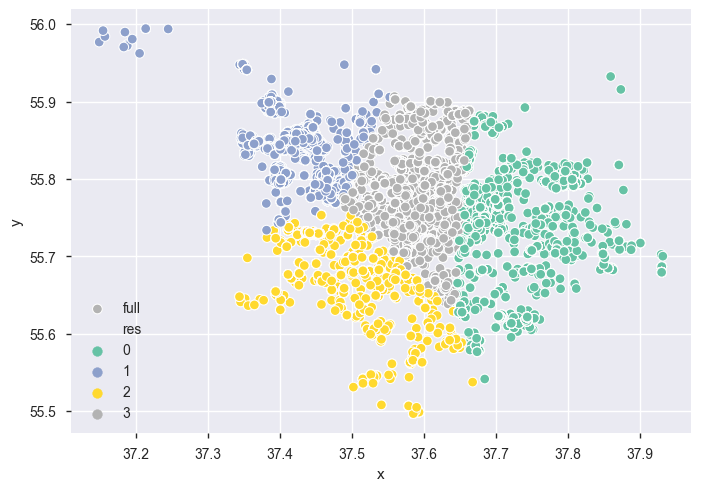

n clusters =  5


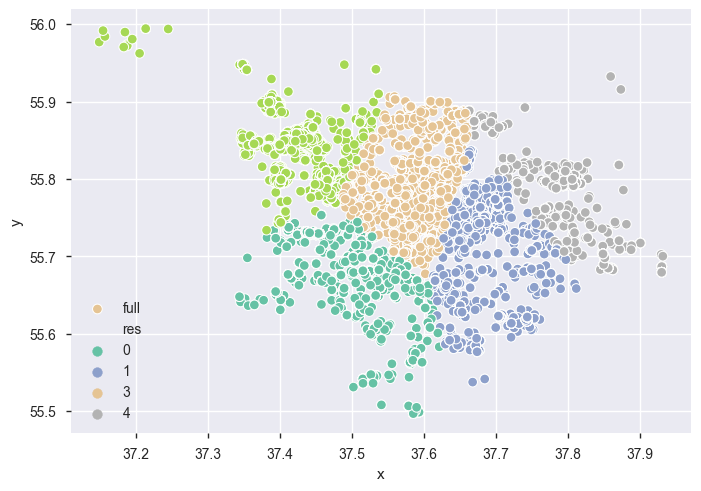

n clusters =  6


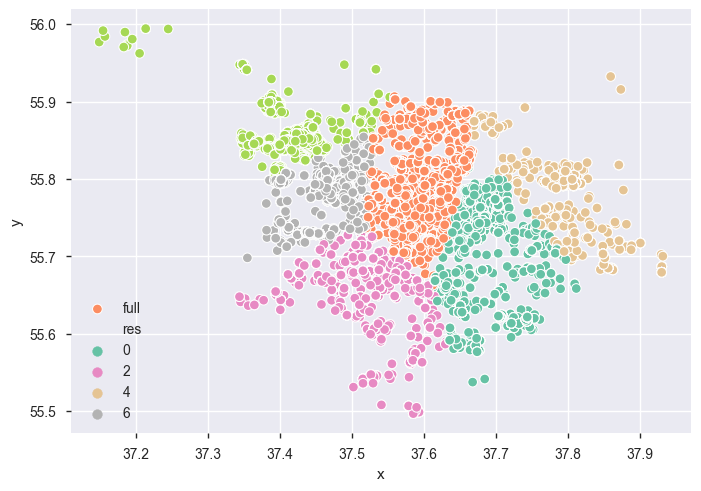

n clusters =  7


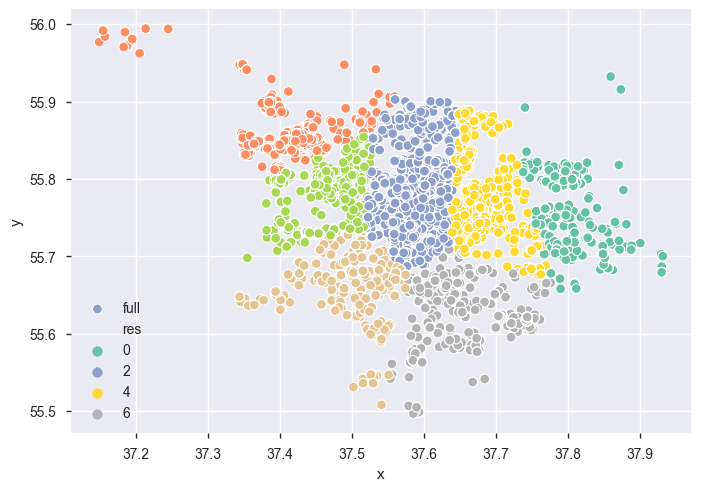

n clusters =  8


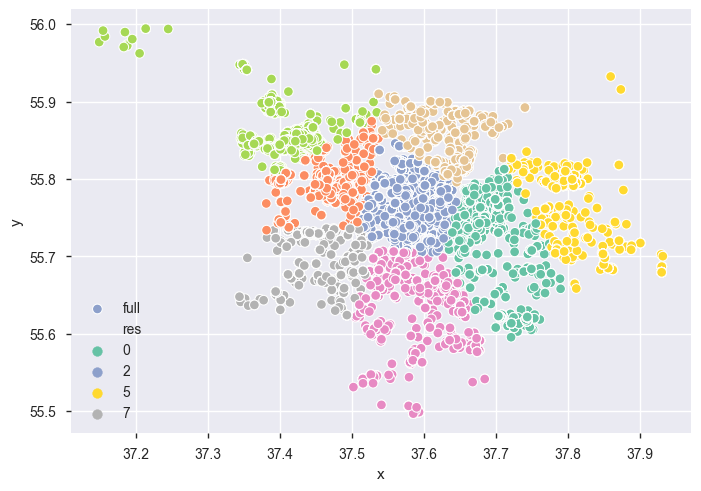

n clusters =  9


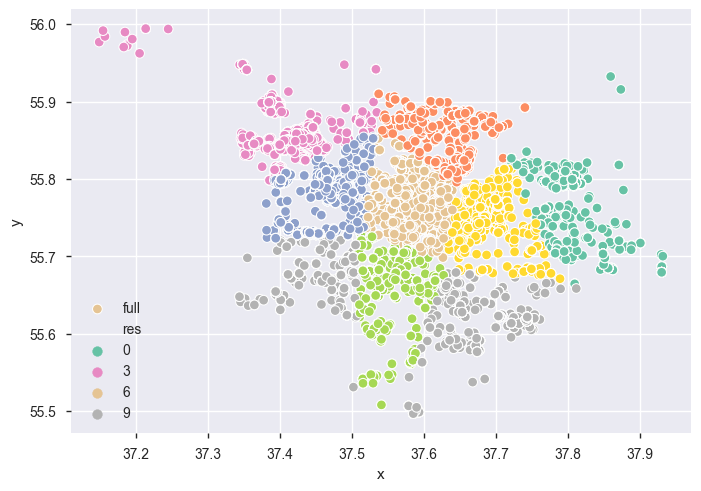

n clusters =  10


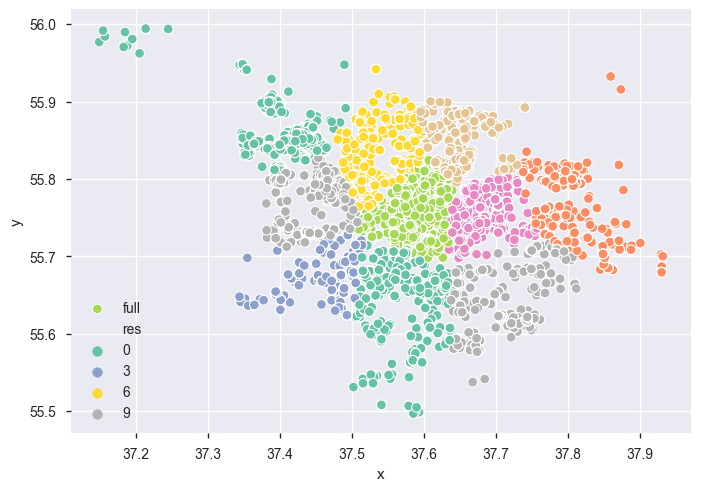

In [192]:
k_inertia = []
ks = range(1,11)

for k in ks:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(df[['x','y']])
    print('n clusters = ', k)
    print_clasters(df, kmeans.labels_)
    
    k_inertia.append(kmeans.inertia_)

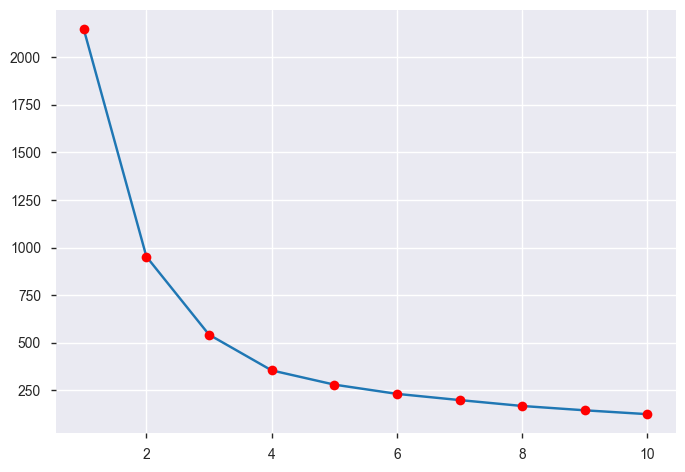

In [193]:
plt.plot(ks, k_inertia)
plt.plot(ks, k_inertia ,'ro')

субъективно kmeans на 10 кластерах работает лучше всего

Но судя по k_inertia нужно остановиться на 4-5